# End-to-end Multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
Evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some info about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning.
* There are 120 breeds of dogs so there are 120 different classes.
* There are around 10,000+ images in both test and train sets.


## Get our workspace ready
* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU


In [1]:
from google.colab import drive
drive.mount('/content/drive')
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

Mounted at /content/drive


In [2]:
import pandas as pd

# Import necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ",tf.__version__)
print("TF Hub Version: ",hub.__version__)

# Check GPU availability
print("GPU ", "available!!!" if tf.config.list_physical_devices("GPU") else "not available.")

TF Version:  2.15.0
TF Hub Version:  0.16.1
GPU  available!!!


In [3]:
# Getting our data ready (Turning the images into Tensors)
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

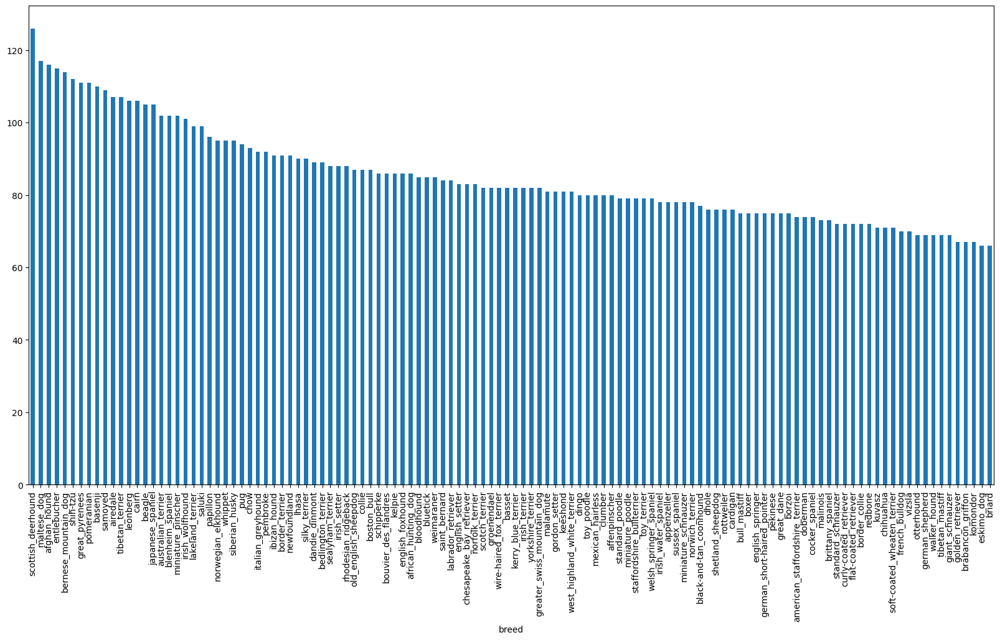

In [12]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

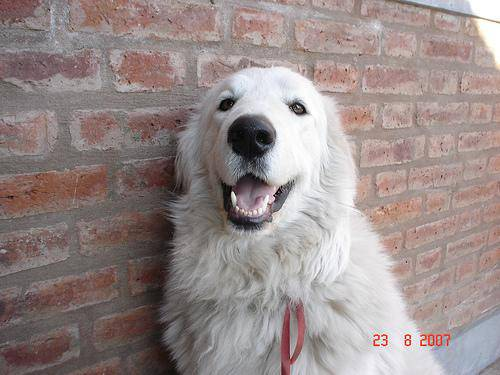

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/0a0c223352985ec154fd604d7ddceabd.jpg")

In [13]:
filenames = ["drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [15]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files! You can proceed.")
else:
  print("Filenames do not match actual amount of files, check it again!")

Filenames match actual amount of files! You can proceed.


PEMBROKE:


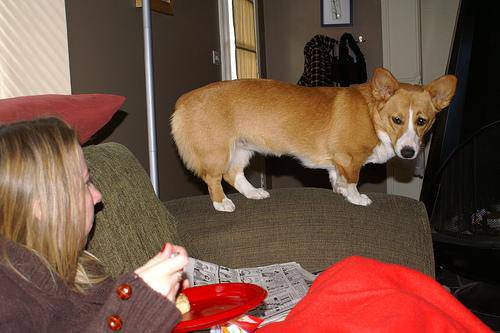

In [ ]:
print(labels_csv["breed"][10000].upper()+":")
Image(filenames[10000])

In [5]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels match the number of filenames.")
else:
  print("Number of labels do NOT match the number of filenames.")

Number of labels match the number of filenames.


In [9]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [16]:
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [17]:
# setting up X & Y
X = filenames
Y = boolean_labels

# start with ~1000 images and increase as needed
NUM_IMAGES = 1000

In [18]:
# Split the data
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [19]:
x_train[:5], y_train[:1]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning into tensors)

By using a function that we wrote which makes these:
1. Take a filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Resize the image to be a shape for (244,244)
5. Return the modified image


In [20]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# tf.constant(image)

In [41]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image path and turns the image into a Tensor.
    """
    # Read an image file
    image = tf.io.read_file(image_path)
    # Turn the jpeg image into a numerical Tensor with 3 color channels (RGB)
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the color channel values from 0-255 to 0-1.
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired value (224, 224)
    image = tf.image.resize(image, size=[img_size, img_size])

    return image

## Turning data into batches

If we're trying to process 10,000+ images in one go they all might not fit into memory.
So, we process about 32 (batch size) images at a time.

In order to use TensorFlow effectively, we neede the data in the form of Tensor tuples like (image, label)

In [ ]:
# Function to create tuples
def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label)
    """
    image = process_image(image_path)
    return image, label

In [35]:
# Function to turn all of our data into batches

BATCH_SIZE = 32
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image(x) and label(y) pairs.
    Shuffles the data if it's training data.
    Also accepts test data as input (no lables).
    """

    # If the data is a test dataset, we probably don't have labels.
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch


    # If the data is a valid dataset, we don't need to shuffle it.
    elif valid_data:
        print("Creating valid data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                                   tf.constant(y))) # labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                  tf.constant(y)))
        # Shuffling pathnames and labels before mapping (shuffling before processing image takes less time)
        data = data.shuffle(buffer_size=len(x))

        # Create (image, label) tuples
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batch = data.batch(BATCH_SIZE)
        return data_batch

In [ ]:
# Create training and validation data
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating valid data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [21]:
import matplotlib.pyplot as plt

In [ ]:
# Function to view images in a data batch
def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch.
    """
    # Setup the figure
    plt.figure(figsize=(10,10))
    # Display the images
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

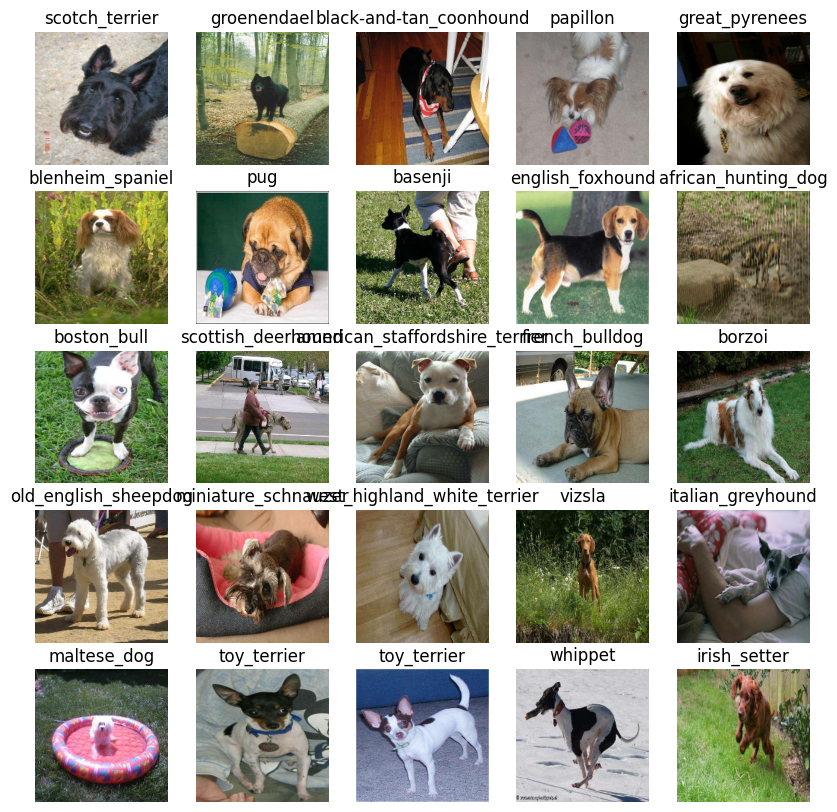

In [ ]:
# Let's visualize the the data in training batch
show_25_images(train_images, train_labels)

## Building a model
Before building it, we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup the shapes of input and output
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

### Put everything together into a Keras deep learning model
Let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model
* Builds the model
* Returns the model

These steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function that builds Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Buildling model with: ", model_url)
    # Setup model layers
    model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
                                tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")]) # Layer 2 (output layer)
    # Compile the model
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=["accuracy"])

    # Build the model
    model.build(INPUT_SHAPE)

    return model

In [ ]:
model = create_model()
model.summary()

Buildling model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
    # Create a log directory for storing tensorboard logs
    logdir = os.path.join("logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

### Training a model (on a subset of data)

In [ ]:
NUM_EPOCHS = 100

In [ ]:
print("GPU", "avaliable!" if tf.config.list_physical_devices("GPU") else "not avaliable")

GPU avaliable!


In [ ]:
# Building a function that trains a model.

def train_model():
  """
  Trains the given model and returns the trained version.
  """
  model = create_model()

  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Buildling model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 272s 11s/step - loss: 4.5616 - accuracy: 0.0975 - val_loss: 3.5592 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6467 - accuracy: 0.6637 - val_loss: 2.2720 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 148ms/step - loss: 0.5794 - accuracy: 0.9362 - val_loss: 1.7231 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 137ms/step - loss: 0.2545 - accuracy: 0.9887 - val_loss: 1.5253 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 176ms/step - loss: 0.1468 - accuracy: 0.9975 - val_loss: 1.4455 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1007 - accuracy: 1.0000 - val_loss: 1.4073 - val_accuracy: 0.6200
E

In [ ]:
%tensorboard --logdir /content/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Making and evaluating predictions

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 111ms/step


array([[1.0540005e-03, 1.7944309e-04, 2.6553957e-04, ..., 7.1851849e-05,
        7.2112023e-05, 1.8147029e-03],
       [5.2501247e-03, 3.8511208e-03, 3.5419043e-03, ..., 1.8421549e-03,
        6.7251474e-03, 1.2465041e-03],
       [2.5967362e-05, 7.5777716e-05, 2.9772589e-06, ..., 6.2739186e-05,
        2.9665047e-05, 7.9873957e-05],
       ...,
       [3.7249224e-06, 6.9063419e-05, 7.9111184e-04, ..., 5.3623211e-05,
        2.2619448e-04, 1.6060742e-04],
       [4.6631587e-03, 1.5106717e-04, 2.3871887e-04, ..., 1.2870383e-04,
        5.0877708e-05, 2.5913035e-02],
       [6.0742418e-04, 4.5049514e-04, 1.1129837e-03, ..., 2.7461300e-02,
        2.0262213e-04, 3.3622838e-04]], dtype=float32)

In [ ]:
(predictions.shape, len(y_val))

((200, 120), 200)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index = 17
print(f"Max value of preds: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


Max value of preds: 0.9357642531394958
Sum: 0.9999998211860657
Max index: 2
Predicted label: african_hunting_dog


In [50]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
pred_label = get_pred_label(predictions[0])
pred_label

'irish_wolfhound'

In [ ]:
# Creating a function to unbatch a batch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)

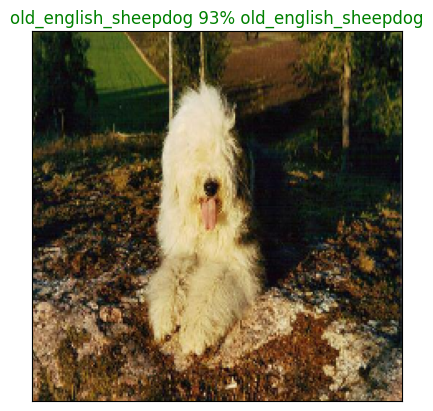

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=7)

In [ ]:
# Let's plot the top 10 prediction instead of only one

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots top 10 highest prediction for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

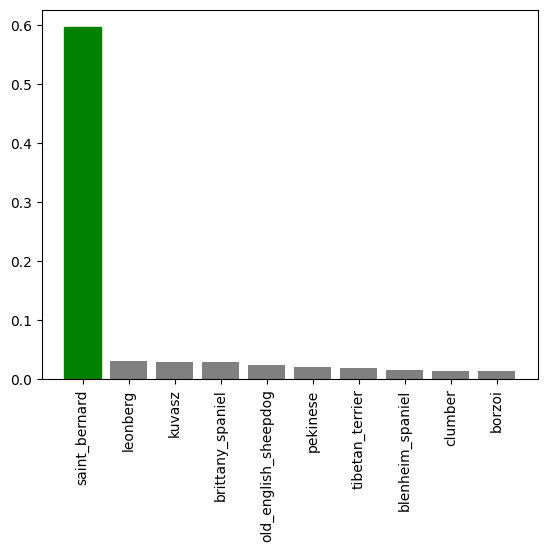

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=8)

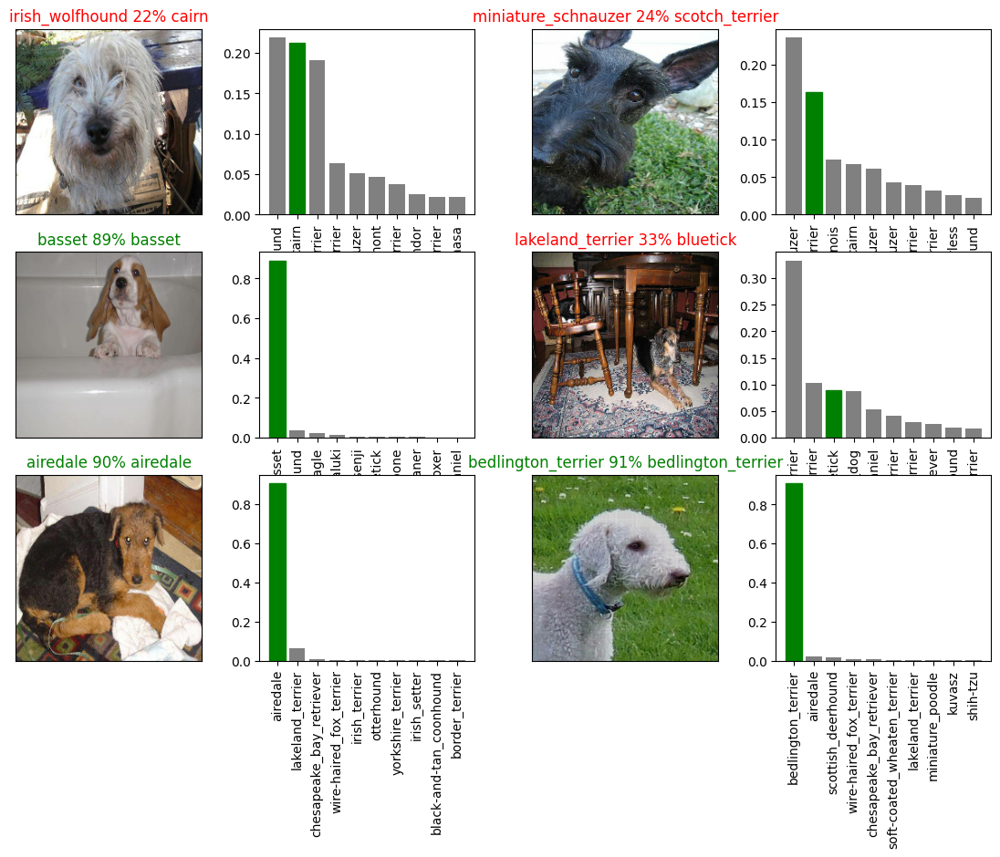

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(7*num_cols, 3*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends a suffix (String)
  """
  modeldir = os.path.join("drive/My Drive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+"-"+suffix+".h5" # h5 is save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [45]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading model from {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240504-19481714852131-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240504-19481714852131-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_image_model = load_model("drive/My Drive/Dog Vision/models/20240430-14081714486110-1000-images-mobilenetv2-Adam.h5")

Loading model from drive/My Drive/Dog Vision/models/20240430-14081714486110-1000-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 103ms/step - loss: 1.3163 - accuracy: 0.6350


[1.3163191080093384, 0.6349999904632568]

In [ ]:
loaded_image_model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2899 - accuracy: 0.6900


[1.2899099588394165, 0.6899999976158142]

### Lets train the big dog model (on the full data)

In [ ]:
len(X), len(Y)

(10222, 10222)

In [ ]:
X[:5]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
Y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
full_data = create_data_batches(X, Y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Buildling model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 134ms/step - loss: 1.3518 - accuracy: 0.6669
Epoch 2/100
320/320 [==============================] - 40s 126ms/step - loss: 0.4053 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 40s 125ms/step - loss: 0.2377 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 49s 152ms/step - loss: 0.1546 - accuracy: 0.9612
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1085 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0775 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0579 - accuracy: 0.9929
Epoch 8/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0464 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0382 - accuracy: 0.9949
Epoch 10/100
320/320 [==============================] - 41s 127m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240504-20221714854162-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240504-20221714854162-full-image-set-mobilenetv2-Adam.h5'

In [46]:
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20240504-20221714854162-full-image-set-mobilenetv2-Adam.h5")

Loading model from drive/My Drive/Dog Vision/models/20240504-20221714854162-full-image-set-mobilenetv2-Adam.h5...


### Making predictions on test dataset

In [23]:
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['drive/MyDrive/Dog Vision/test/df4a5ab3464b937e11467c395ed190b9.jpg',
 'drive/MyDrive/Dog Vision/test/e17512584de423da7fc17bfb2c7548ae.jpg',
 'drive/MyDrive/Dog Vision/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/Dog Vision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/Dog Vision/test/e0c11786a50ce49abdb71397d711ecc9.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1992s 6s/step


In [ ]:
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [7]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=',')

In [8]:
test_predictions[10:]

array([[8.68085443e-14, 2.46233329e-12, 2.63514796e-14, ...,
        3.32211031e-14, 7.28424352e-12, 7.18050966e-12],
       [1.04036779e-10, 1.40392400e-08, 3.76935283e-09, ...,
        9.34671993e-11, 2.86820567e-10, 9.44806950e-13],
       [1.03898012e-09, 5.05957831e-10, 3.16408011e-09, ...,
        3.32259242e-06, 5.53903341e-01, 2.93954390e-08],
       ...,
       [4.61850530e-10, 2.27358110e-09, 2.75843810e-08, ...,
        1.92340122e-09, 5.83920439e-07, 1.72063448e-08],
       [4.08984430e-10, 8.16244317e-09, 1.04304698e-08, ...,
        2.33865293e-07, 1.57803086e-07, 8.70526605e-07],
       [1.34728062e-09, 1.50190065e-08, 2.88433943e-09, ...,
        6.39944290e-07, 1.54405128e-10, 3.66835277e-11]])

## Prep for Kaggle submission

In [11]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [28]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [30]:
preds_df[list(unique_breeds)] = test_predictions

In [31]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df4a5ab3464b937e11467c395ed190b9,2.754130e-09,2.638564e-11,7.104267e-12,1.275106e-05,1.010394e-08,2.121553e-08,1.081272e-09,3.569701e-09,3.431166e-10,...,7.748156e-09,1.237011e-08,7.274696e-12,8.662826e-06,5.364046e-08,3.406764e-10,1.261192e-05,1.909048e-09,8.327152e-06,8.338500e-10
1,e17512584de423da7fc17bfb2c7548ae,1.822550e-10,2.221624e-10,4.159035e-10,1.295598e-07,2.994638e-04,5.077500e-07,3.366760e-10,3.708626e-09,3.002582e-08,...,5.440060e-10,1.698313e-08,1.027095e-04,2.966419e-04,1.035676e-03,3.336097e-09,1.033302e-08,2.637948e-09,1.852008e-09,1.105413e-11
2,de291f05facd9c7db8d4880a0c84263b,1.495555e-10,6.425027e-09,3.071833e-09,8.836435e-11,4.708591e-09,8.202373e-09,1.762606e-09,1.544229e-03,1.930636e-02,...,4.446711e-07,2.999562e-10,1.687843e-06,8.872065e-08,9.764910e-01,1.921440e-08,9.006937e-11,3.360443e-06,3.416980e-10,1.479459e-08
3,e7b357150635c250757363718e4dae86,3.156398e-06,9.519457e-10,1.767688e-08,1.541639e-06,2.659990e-06,1.094064e-09,2.478565e-04,3.767894e-06,1.316472e-07,...,3.151481e-05,3.283448e-03,4.657538e-07,8.629140e-08,4.340227e-09,4.199648e-08,1.128624e-03,3.115410e-07,1.605745e-08,1.943724e-05
4,e0c11786a50ce49abdb71397d711ecc9,2.703811e-08,7.509144e-07,5.122596e-10,1.537815e-07,6.543159e-06,3.435854e-04,1.410287e-04,2.626125e-06,5.975381e-07,...,2.837608e-06,4.078518e-09,1.762512e-06,1.464848e-07,1.069307e-07,1.026545e-05,1.405998e-07,1.429511e-10,3.400623e-07,7.705114e-03


In [34]:
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

# Custom image predictions

In [38]:
custom_path = "drive/My Drive/Dog Vision/custom-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [39]:
custom_image_paths

['drive/My Drive/Dog Vision/custom-dog-photos/dog-1.jpg']

In [42]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [47]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [49]:
custom_preds.shape

(1, 120)

In [51]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['west_highland_white_terrier']

In [53]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

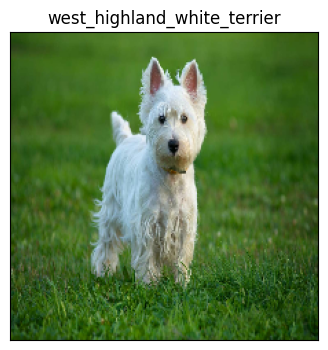

In [55]:
plt.figure(figsize=(4,4))
for i, image in enumerate(custom_images):
  plt.subplot(1,1, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)